# Подготовка данных посредством Airflow

In [1]:
# Установка дополнительных библиотек
%pip install ipywidgets -q
%pip install sweetviz -q
%pip install seaborn -q
%pip install folium -q

In [2]:
# Импорт библиотек, классов и функций
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
import folium
from dotenv import load_dotenv
from sqlalchemy import create_engine, inspect
from airflow.providers.postgres.hooks.postgres import PostgresHook
from folium.plugins import MarkerCluster
from tqdm.notebook import tqdm

In [3]:
# Определение констант
TBL_BUILDINGS = 'buildings' # Таблица с информацией по зданиям
TBL_FLATS = 'flats' # Таблица с информацией по квартирам
TBL_DST = 'flats_fstore' # новая таблица для хранения признаков
TBL_DST_CLEAN = 'flats_fstore_clean' # новая таблица для данных после очистки
RANDOM_STATE = 42

# настройка
plt.set_loglevel("Warning")

In [4]:
# подгрузка .env
load_dotenv()

True

In [5]:
# Считывание информации для авторизации
pg_host = os.environ.get('DB_DESTINATION_HOST')
pg_port = os.environ.get('DB_DESTINATION_PORT')
pg_username = os.environ.get('DB_DESTINATION_USER')
pg_password = os.environ.get('DB_DESTINATION_PASSWORD')
pg_db = os.environ.get('DB_DESTINATION_NAME')

In [6]:
# Создание соединений
conn = create_engine(f'postgresql://{pg_username}:{pg_password}@{pg_host}:{pg_port}/{pg_db}')

## Этап 1: Сбор данных

### Оценка данных

In [7]:
# Загрузка данных из БД
df_buildings = pd.read_sql(f"SELECT * FROM {TBL_BUILDINGS}", conn)
df_flats = pd.read_sql(f"SELECT * FROM {TBL_FLATS}", conn)

In [8]:
print("Таблица buildings")
df_buildings.info()
print("\nСлучайные 15 записей таблицы buildings:")
df_buildings.sample(15, random_state=RANDOM_STATE)
del df_buildings

Таблица buildings
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24620 entries, 0 to 24619
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 24620 non-null  int64  
 1   build_year         24620 non-null  int64  
 2   building_type_int  24620 non-null  int64  
 3   latitude           24620 non-null  float64
 4   longitude          24620 non-null  float64
 5   ceiling_height     24620 non-null  float64
 6   flats_count        24620 non-null  int64  
 7   floors_total       24620 non-null  int64  
 8   has_elevator       24620 non-null  bool   
dtypes: bool(1), float64(3), int64(5)
memory usage: 1.5 MB

Случайные 15 записей таблицы buildings:


Таблица `buildings` содержит 24620 записей, пропуски отсутствуют. Таблица содержит 9 полей:
- `id` — ID дома,
- `build_year` — год постройки,
- `building_type_int` — тип здания,
- `latitude` — широта, на которой находится дом,
- `longitude` — долгота, на которой находится дом,
- `ceiling_height` — высота потолков в здании,
- `flats_count` — общее количество квартир,
- `floors_total` — общее количество этажей,
- `has_elevator` — наличие лифта.

In [9]:
print("Таблица flats:")
df_flats.info()
print("\nСлучайные 15 записей таблицы flats:")
df_flats.sample(15, random_state=RANDOM_STATE)
del df_flats

Таблица flats:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141362 entries, 0 to 141361
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            141362 non-null  int64  
 1   floor         141362 non-null  int64  
 2   is_apartment  141362 non-null  bool   
 3   kitchen_area  141362 non-null  float64
 4   living_area   141362 non-null  float64
 5   rooms         141362 non-null  int64  
 6   studio        141362 non-null  bool   
 7   total_area    141362 non-null  float64
 8   price         141362 non-null  int64  
 9   building_id   141362 non-null  int64  
dtypes: bool(2), float64(3), int64(5)
memory usage: 8.9 MB

Случайные 15 записей таблицы flats:


Таблица flats содержит 141'362 записи, пропуски также отсутствуют. Таблица содержит 10 полей:
- `id` — ID квартиры,
- `floor` — этаж, на котором находится квартира,
- `is_apartment` — является ли квартира апартаментами,
- `kitchen_area` — площадь кухни,
- `living_area` — площадь гостиной,
- `rooms` — количество комнат,
- `studio` — является ли квартира студией,
- `total_area` — общая площадь квартиры,
- `price` — цена квартиры,
- `building_id` — ID дома, в котором находится квартира.

Целевой признак `price`, а также основные признаки содержатся в таблице flats. В таблице buildings содержатся дополнительные признаки, которые будут полезными для обучения модели.

Подготовим шаблон функции извлечения данных для ETL-пайплайна.

### Извлечение данных (Extract) и создание таблицы

In [10]:
def extract() -> pd.DataFrame:
    #hook = PostgresHook("destination_db")
    sql_query = f"""
    SELECT 
        f.id, f.rooms, f.total_area, f.kitchen_area, f.living_area, 
        f.floor, f.studio, f.is_apartment, b.building_type_int, 
        b.build_year, b.latitude, b.longitude, b.ceiling_height, 
        b.flats_count, b.floors_total, b.has_elevator, f.price
    FROM {TBL_FLATS} AS f
    LEFT JOIN {TBL_BUILDINGS} AS b ON b.id = f.building_id
    """
    #conn = hook.get_conn()
    data = pd.read_sql(sql_query, conn)
    #hook.close()
    return data

Функция готова, оценим полученные данные

In [11]:
data = extract()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141362 entries, 0 to 141361
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 141362 non-null  int64  
 1   rooms              141362 non-null  int64  
 2   total_area         141362 non-null  float64
 3   kitchen_area       141362 non-null  float64
 4   living_area        141362 non-null  float64
 5   floor              141362 non-null  int64  
 6   studio             141362 non-null  bool   
 7   is_apartment       141362 non-null  bool   
 8   building_type_int  141362 non-null  int64  
 9   build_year         141362 non-null  int64  
 10  latitude           141362 non-null  float64
 11  longitude          141362 non-null  float64
 12  ceiling_height     141362 non-null  float64
 13  flats_count        141362 non-null  int64  
 14  floors_total       141362 non-null  int64  
 15  has_elevator       141362 non-null  bool   
 16  pr

После объединения данных имеем датасет из 17 признаков, из которых признак `price` является целевым, а признак `id` не будет использоваться для обучения модели. По проекту стоит задача регрессии, соответственно целевой признак не требует какой-либо предварительной обработки и выделения, пропуски в признаках отсутствуют, трансформация на этом этапе не требуется, данные будут загружаться как есть в промежуточную таблицу. 

Подготовим функцию создания таблицы для добавления в DAG, на случай, если такая таблица отсутствует в базе данных.

In [12]:
# Функция создания таблицы при ее отсутствии
def create_table():
    #hook = PostgresHook("destination_db")
    #conn = hook.get_sqlalchemy_engine()
    from sqlalchemy import MetaData
    metadata = MetaData()
    from sqlalchemy import Table, Column, Integer, BigInteger, Float, Boolean, UniqueConstraint, inspect
    flats_fstore = Table(
        TBL_DST, metadata,
        Column("id", Integer, primary_key=True, autoincrement=True),
        Column("rooms", Integer),
        Column("total_area", Float),
        Column("kitchen_area", Float),
        Column("living_area", Float),
        Column("floor", Integer),
        Column("studio", Boolean),
        Column("is_apartment", Boolean),
        Column("building_type_int", Integer),
        Column("build_year", Integer),
        Column("latitude", Float),
        Column("longitude", Float),
        Column("ceiling_height", Float),
        Column("flats_count", Integer),
        Column("floors_total", Integer),
        Column("has_elevator", Boolean),
        Column("price", BigInteger),
        UniqueConstraint('id', name='unique_flat_id_constraint')
    )
    if not inspect(conn).has_table(flats_fstore.name): 
        metadata.create_all(conn)
    #hook.close()

Проверим работоспособность функции.

In [13]:
create_table()
if inspect(conn).has_table(TBL_DST):
    print(f"Таблица {TBL_DST} создана")
else:
    print("Что-то пошло не так =(")

Таблица flats_fstore создана


### Трансформация (Transform) и загрузка (Load) данных

Так как трансформация данных (Transform) не требуется, функция трансформации (Transform) будет передавать данные как есть для их дальнейшей загрузки (Load). Подготовим функцию трансформации и загрузки данных для DAG:

In [14]:
# Функция трансформации, в нашем случае этот шаг можно пропустить
def transform(data: pd.DataFrame) -> pd.DataFrame:
    return data

# Функция загрузки
def load(data: pd.DataFrame):
    try: # Эта часть для DAG
        #hook = PostgresHook("destination_db")
        hook = None # Для проверки в ноутбуке без установки Airflow
        hook.insert_rows(
            table=TBL_DST,
            replace=True,
            target_fields=data.columns.tolist(),
            replace_index=['id'],
            rows=data.values.tolist()
        )
        hook.close()
    except Exception as e: # Эта часть только для загрузки из ноутбука без Airflow
        err_msg = str(e)
        data.to_sql(TBL_DST, con=conn, if_exists="replace", index=False)

load(data)

Функции перенесены в файл `part1_airflow\dags\flats_fstore.py` с использованием декораторов Airflow. Для запуска сервисов развернуты Docker контейнеры сервисов Airflow версии 2.7.3 посредством Docker Compose и расширен исходный образ `apache/airflow:2.7.3-python3.10`.

### Промежуточные итоги

В рамках 1-го этапа произведено извлечение данных с объединением таблиц. Данные без трансформации загружены в базу `flats_fstore` посредством DAG. Подготовка DAG произведена с использованием декораторов airflow. Первый DAG, который обеспечивает перенос объединенных данных в хранилище признаков, располагается в файле `part1_airflow\dags\flats_fstore.py`.

Чтобы получать оповещения в случаях успеха или неудачи во время выполнения DAG, использован плагин для отправки сообщений в Telegram. Сообщение отправляет Telegram бот в группу [TestAirflow](https://t.me/+vmtO5jVkLgtjZjEy "Invite link to Telegram group"). Код плагина располагается в файле `part1_airflow\plugins\steps\messages.py`.

## Этап 2: Очистка данных

### Исследовательский анализ данных (EDA)

In [15]:
# Фукнция добавления заголовков и подписей на графики
def add_plot_titles(
    suptitle=None, suptitle_size=16, suptitle_color="C0",
    xlabel=None, xlabel_size=None, xlabel_color="k",
    ylabel=None, ylabel_size=None, ylabel_color="k",
    minor_grid=True, show=True
):
    if suptitle: plt.suptitle(suptitle, size=suptitle_size, color=suptitle_color)
    if xlabel: plt.xlabel(xlabel, size=xlabel_size, color=xlabel_color)
    if ylabel: plt.ylabel(ylabel, size=ylabel_size, color=ylabel_color)
    if minor_grid:
        plt.grid(True, which='minor', axis='x', linestyle='--', alpha=0.7)
    if show: 
        plt.tight_layout()
        plt.show()

                                             |          | [  0%]   00:00 -> (? left)


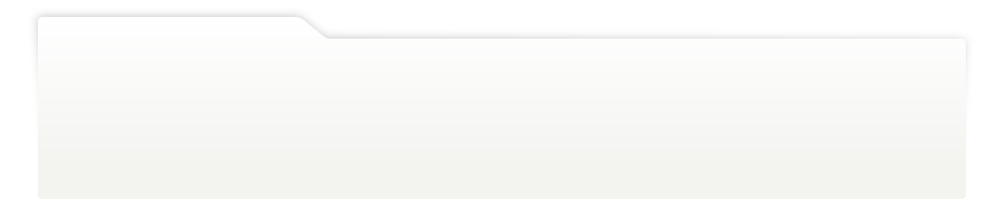
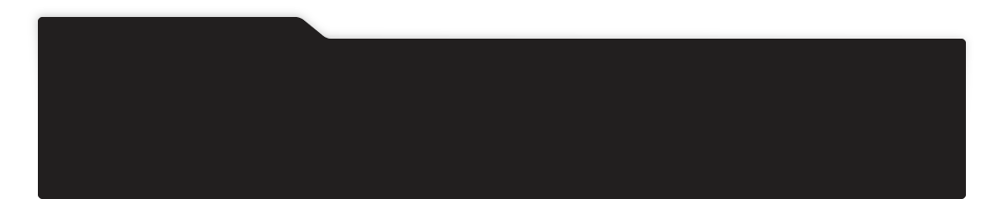
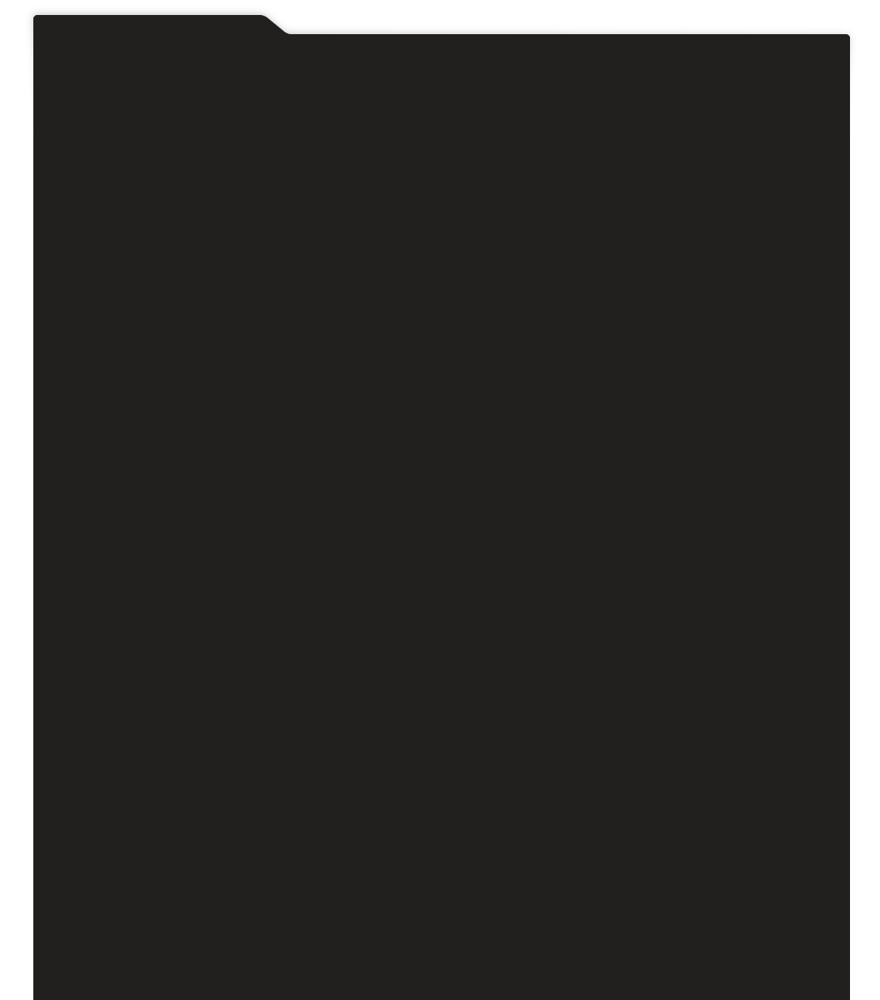
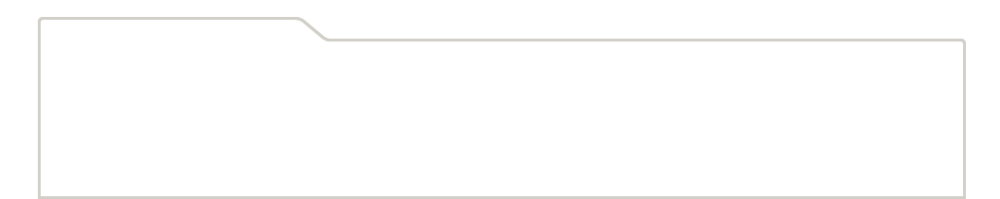
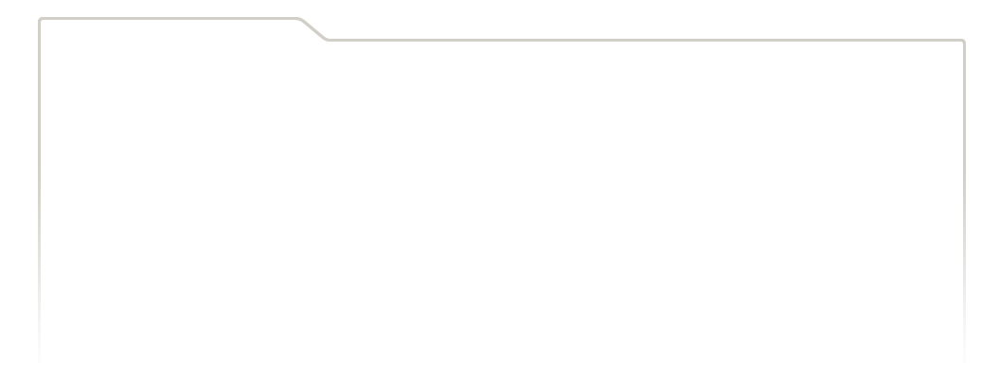
...
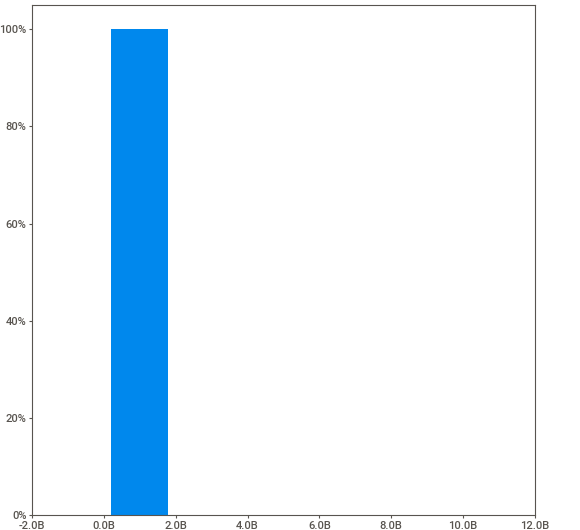
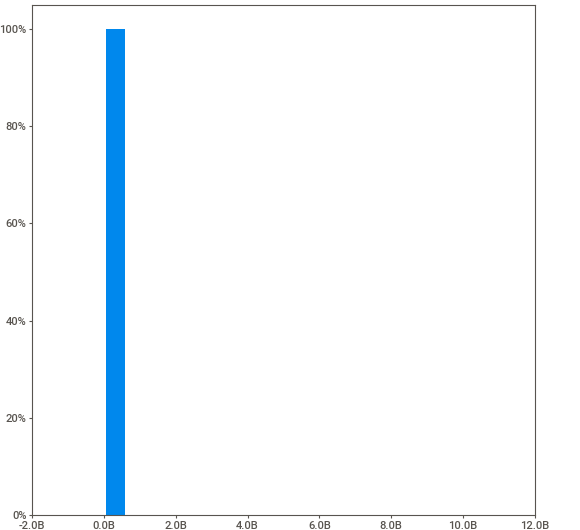
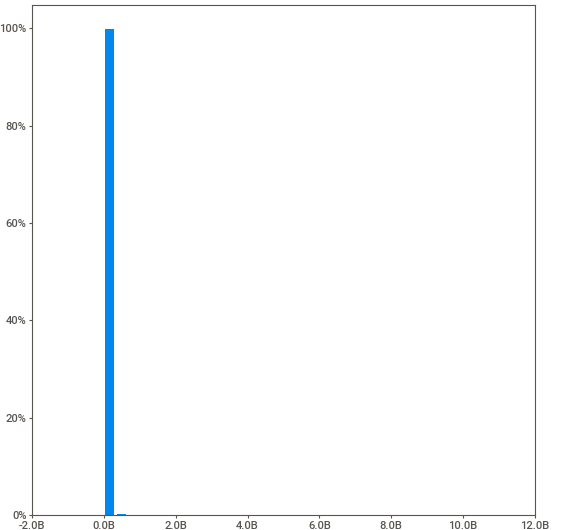
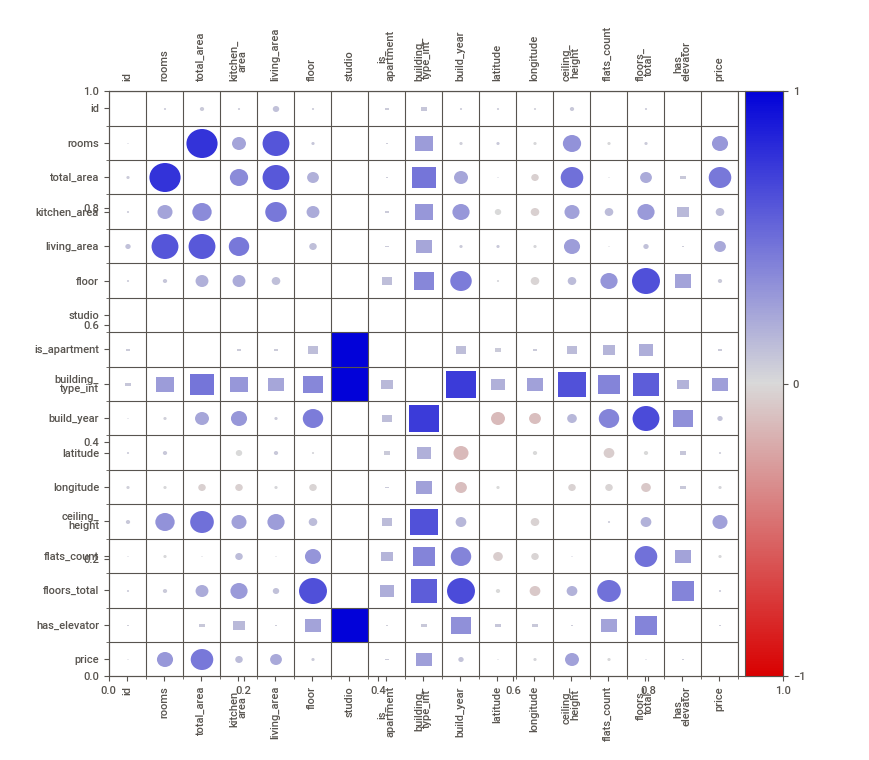
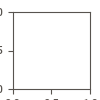

In [16]:
# Вывод отчета SweetVIZ
report_floor = sv.analyze(data)
report_floor.show_notebook()
del report_floor

По признакам датасета можно отметить следующее:
1. Из 17 признаков предположительно 4 являются категориальными (`is_apartment`, `studio`, `building_type_int` и `has_elevator`), а остальные числовыми.
2. По признаку `studio` имеется только значение `False`. Возможно в датасет не выгружаются квартиры-студии, соответственно данный признак будет лишним для обучения модели. Также основная масса записей (более 99%) имеет значение `False` по признаку `is_apartment`.
3. Имеются большие выбросы в признаках площади (`kitchen_area`, `living_area`, `total_area`), а также в признаках `rooms`, `ceiling_height` и целевом признаке `price`.
4. Достаточно большое количество нулевых значений в признаках `kitchen_area` (8%) и `living_area` (13%).

По целевому признаку наибольшая корреляция наблюдается с числовыми признаками `total_area` (0.42), `rooms` (0.26), `ceiling_height` (0.22) и `living_area` (0.18), а также с категориальной `building_type_int`. Оценим признаки датасета.

#### Дубликаты в данных

Оценим количество явных дубликатов в датасете.

In [17]:
feature_cols = data.drop(columns=["id"]).columns.to_list()
print("Количество неявных дубликатов:",
      data.duplicated(subset=feature_cols).sum())

Количество неявных дубликатов: 9116


Вероятнее всего это одни и те же квартиры, так как объявления на продажу могут подаваться как ее хозяином, так и посредником (и возможно не одним). Также могут продаваться однотипные квартиры по одному адресу, например в новостройках. Так как дубликаты не несут дополнительной информации для моделей машинного обучения, избавимся от дублирующихся записей.

In [18]:
data = data.drop_duplicates(subset=feature_cols).reset_index(drop=True)
print("Размер датасета после удаления дубликатов:", data.shape[0])

Размер датасета после удаления дубликатов: 132246


#### Количество комнат

По количеству комнат значения начинаются с 1, а максимальное значение доходит до 20-ти. Основная масса квартир до 4-х комнат, это порядка 95% от датасета, а на квартиры более 6-ти комнат приходится менее 0,2%. Оценим распределение комнат по цене в разрезе типов зданий. Так как имеются большие выбросы по целевому признаку, график построим с логарифмической шкалой.

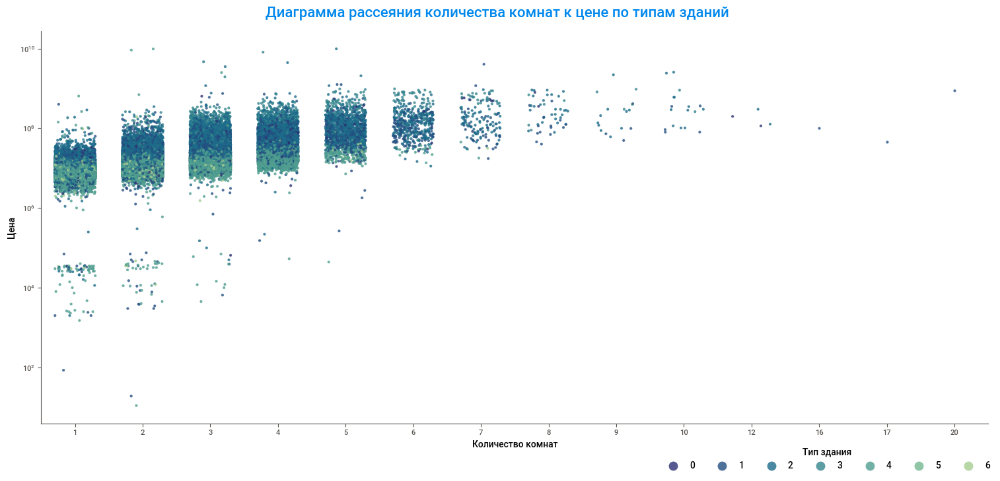

In [19]:
ax = sns.catplot(
    data, x="rooms", y="price", hue="building_type_int", size=3,
    jitter=0.3, alpha=0.8, height=7, aspect=2, log_scale=True, palette="crest_r")
sns.move_legend(ax, "right", bbox_to_anchor=(1, 0), ncol=7, title="Тип здания")
for handles in ax.legend.legend_handles:
    handles.set_markersize(10)
add_plot_titles(suptitle="Диаграмма рассеяния количества комнат к цене по типам зданий",
                xlabel="Количество комнат", ylabel="Цена")

Заметен рост стоимости квартир по мере увеличения количества комнат, однако рост нелинейный и напоминает больше функцию корня. Также по типу здания заметно, что более высокие значения типа здания представлены преимущественно для квартир с меньшим количеством комнат и по мере их роста увеличивается преобладание меньших значений типа здания. Можно сделать предположение, что численные типы зданий могут означать различные классы зданий - от элитного до эконом, однако могут иметь и соврешнно иную основу.

Дополнительно заметна группа квартир, стоимость которых существенно ниже основной массы, количество комнат в основном от 1 до 3, но таких объявлений немного.

Чтобы избавиться от выбросов - возможных некорректных и/или редких значений количества комнат, ограничим значения данного признака в пределах от 1 до значений не превышающих 1.5-кратный межквартильный размах свыше 3-го квартиля. Все значения, выходящие за пределы этого промежутка подлежат удалению. Подготовим фукнцию, которая будет определять, является или нет значение выбросом.

In [20]:
def is_outlier(
    df: pd.DataFrame, target: str, min_val: int | None = None, 
    max_val: int | None = None, threshold=1.5
) -> pd.Series:
    Q1 = df[target].quantile(0.25)
    Q3 = df[target].quantile(0.75)
    min_val = max(Q1 - threshold * (Q3 - Q1), min_val) if min_val else Q1 - threshold * (Q3 - Q1)
    print("Минимальное значения для признания выбросом:", min_val)
    max_val = min(threshold * (Q3 - Q1) + Q3, max_val) if max_val else Q3 + threshold * (Q3 - Q1)
    print("Максимальное значения для признания выбросом:", max_val)
    return (df[target] < min_val) | (df[target] > max_val)

In [21]:
print("Количество выбросов признака rooms:", is_outlier(data, "rooms", 1).sum())

Минимальное значения для признания выбросом: 1
Максимальное значения для признания выбросом: 6.0
Количество выбросов признака rooms: 253


Исключим выбросы по признаку rooms:

In [22]:
data = data[~is_outlier(data, "rooms", min_val=1)]
print("Количество записей после удаления выбросов:", data.shape[0])

Минимальное значения для признания выбросом: 1
Максимальное значения для признания выбросом: 6.0
Количество записей после удаления выбросов: 131993


#### Площадь

В датасете представлены 3 площади:
- Общая площадь `total_area`;
- Площадь кухни `kitchen_area`;
- Жилая площадь `living_area`.

**Общая площадь** имеет большой разброс значений в пределах от 11 до более 960 квадратных метров. Наибольшая корреляция с признаком количества комнат. Также имеется корреляция с другими площадями (жилая / кузня) и высотой потолков, а в части категориальных - с типом здания. Оценим распределение количества комнат к общей площади в разрезе типов здания.

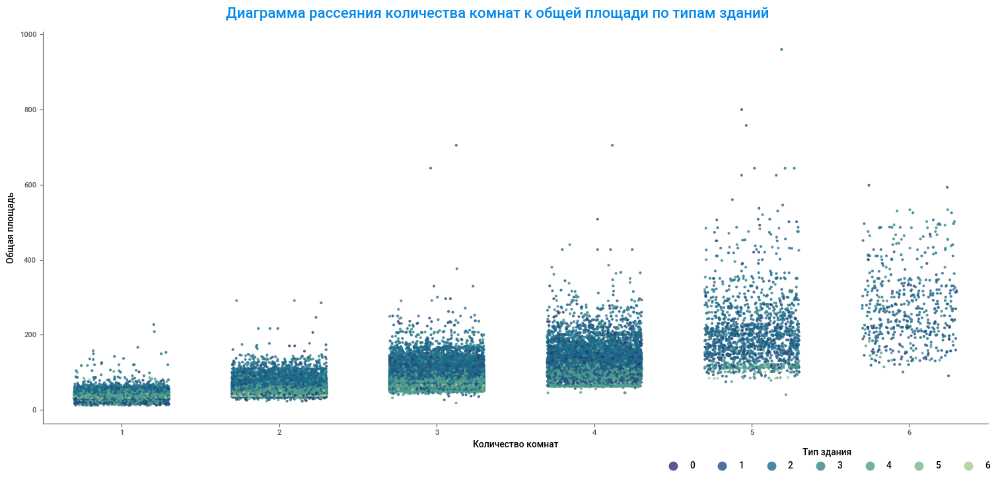

In [23]:
ax = sns.catplot(
    data, x="rooms", y="total_area", hue="building_type_int", size=3,
    jitter=0.3, alpha=0.8, height=7, aspect=2, palette="crest_r")
sns.move_legend(ax, "right", bbox_to_anchor=(1, 0), ncol=7, title="Тип здания")
for handles in ax.legend.legend_handles:
    handles.set_markersize(10)
add_plot_titles(suptitle="Диаграмма рассеяния количества комнат к общей площади по типам зданий",
                xlabel="Количество комнат", ylabel="Общая площадь")

По графику заметно, что по мере увеличения количества комнат увеличивается и общая площадь. Также для более распространенных типов зданий заметно ранжирование внутри каждой группы по количеству комнат, а также изменение соотношения одних типов зданий с другими по мере увеличения количества комнат. Наиболее приемлемым вариантом в таком случае будет отсеивать выбросы в разрезе количества комнат и типов зданий.

Оценим распределение крайних значений для выбросов на основе межквартильного интервала.

In [24]:
data.groupby(
    ["rooms", "building_type_int"]
)["total_area"].quantile(
    [0, .01, .05, .25, .5, .75, .95, .99, 1]
).to_frame().unstack().droplevel(0, axis=1).apply(
    lambda x: pd.Series({
        "min": x[0.00], "min_out": x[0.25] - 1.5 * (x[0.75] - x[0.25]), "1%": x[0.01], 
        "5%": x[0.05], "Q1": x[0.25], "Q2": x[0.50], "Q3":x[0.75], "95%": x[0.95], 
        "99%": x[0.99], "max_out": x[0.75] + 1.5 * (x[0.75] - x[0.25]), "max": x[1.00]
}), axis=1).style.background_gradient(
    cmap=sns.diverging_palette(250, 25, as_cmap=True), axis=1
).format("{:,.2f}")

Предоставленные данные имеют достаточно сложное распределение, для некоторых значений площади межквартильный размах явно занижает максимальные значения для определения выброса, либо сильно превосходит имеющиеся значения. Чаще всего пользователи достаточно ответственно подходят к указанию общей площади, однако лучше отсекать сильно отличающиеся значения, на случай ошибок в заполнении. 

Доработаем функцию для возможности указания групп, по которым нужно проводить оценку выбросов на основе межквартильного размаха. И справним какое количество значений признается выбросом с учетом и без учета групп. Для минимального значения площади установим 6 квадратных метров, т.к. это минимальнае допустимае законодательством площадь для одного человека по санитарным нормам. Максимальное значение также будет ограничено 1.5 кратным межквартильным размахом от 3-го квартиля.

In [25]:
def is_outlier(
    df: pd.DataFrame, target: str, by: list | None = None,
    min_val: int | None = None, max_val: int | None = None, threshold=1.5
) -> pd.Series:
    df = df.copy()
    if by is None:
        print("Выбросы без группировки")
        Q1 = df[target].quantile(0.25)
        Q3 = df[target].quantile(0.75)
        min_val = max(Q1 - threshold * (Q3 - Q1), min_val) if min_val else Q1 - threshold * (Q3 - Q1)
        print("Минимальное значения для признания выбросом:", min_val)
        max_val = min(threshold * (Q3 - Q1) + Q3, max_val) if max_val else Q3 + threshold * (Q3 - Q1)
        print("Максимальное значения для признания выбросом:", max_val)
    else:
        print(f"Выбросы с группировкой по {by}")
        # Получение межквартильного отклонения для каждой группы
        vals = df.groupby(
            by=by)[target].quantile([.25, .75]).to_frame().unstack().droplevel(0, axis=1).apply(
            lambda x:
            pd.Series({
                "min_val": x[0.25] - threshold * (x[0.75] - x[0.25]),
                "max_val": x[0.75] + threshold * (x[0.75] - x[0.25])
            }), axis=1
        )
        # Добавление ограничений минимального и максимального значения
        if min_val: vals.loc[vals["min_val"] < min_val, "min_val"] = min_val
        if max_val: vals.loc[vals["max_val"] > max_val, "max_val"] = max_val
        # Добавление ограничений к каждой записи датасета by
        vals = df.join(vals, on=by)[["min_val", "max_val"]]
        min_val = vals["min_val"]
        print("Минимальное значение выброса по всем группам:",
              min_val.min())
        max_val = vals["max_val"]
        print("Максимальное значение выброса по всем группам:",
              max_val.max())
    return (df[target] < min_val) | (df[target] > max_val)

In [26]:
print("Количество выбросов признака rooms (с группировкой):", 
      is_outlier(data, "total_area", by=["rooms", "building_type_int"], min_val=6).sum())
print()
print("Количество выбросов признака rooms (без группировки):", 
      is_outlier(data, "total_area", min_val=6).sum())

Выбросы с группировкой по ['rooms', 'building_type_int']
Минимальное значение выброса по всем группам: 6.0
Максимальное значение выброса по всем группам: 725.75
Количество выбросов признака rooms (с группировкой): 3819

Выбросы без группировки
Минимальное значения для признания выбросом: 6
Максимальное значения для признания выбросом: 119.45000648498535
Количество выбросов признака rooms (без группировки): 7239


В случае применения группировки по признакам, выбросами признаются 3819 записей, а без применения группировки признается практически в 2 раза больше записей. Произведем очистку от выбросов по признаку `total_area` с группировкой по `rooms` и `building_type_int`. Возможно более оптимальным решением будет увеличить коэффициент межквартильного размаха, однако такой вопрос лучше урегулировать с Заказчиком.

In [27]:
data = data[~is_outlier(
    data, "total_area", by=["rooms", "building_type_int"], min_val=6)].copy()
print("Количество записей после удаления выбросов:", data.shape[0])

Выбросы с группировкой по ['rooms', 'building_type_int']
Минимальное значение выброса по всем группам: 6.0
Максимальное значение выброса по всем группам: 725.75
Количество записей после удаления выбросов: 128174


**Площадь кухни** имеет довольно большое количество нулевых значений в исходном датасете - порядка 8.3%, значения больше 0 начинаются с 1.5 квадратных метра и доходит до 203. Площадь кухни обычно заполняется более ответственно, однако ее необходимо рассматривать совместно с общей и жилой площадью.

**Жилая площадь** имеет еще больше нулевых значений в исходном датасете - 13.1%, значения более 0 начинаются с 2 квадратов и доходят до 700. Вероятнее всего нулевые значения просто не были заполнены пользователями. Проверим не выходят ли суммарные значения площади кухни и жилой площади за значения общей площади.

In [28]:
display(data[(data["kitchen_area"] + data["living_area"]) > data["total_area"]])
print(f"Среднее отношение площади кухни к общей: {(data['kitchen_area'] / data['total_area']).mean():.2%}")
print(f"Среднее отношение жилой площади к общей: {(data['living_area'] / data['total_area']).mean():.2%}")

,id,rooms,total_area,kitchen_area,living_area,floor,studio,is_apartment,building_type_int,build_year,latitude,longitude,ceiling_height,flats_count,floors_total,has_elevator,price
494,498,1,32.000000,19.5,19.500000,5,False,False,6,1962,55.806068,37.581371,2.64,64,9,True,8050000
568,572,3,72.900002,21.0,65.000000,2,False,False,3,2016,55.569942,37.487621,3.00,297,16,True,17800000
1145,1152,3,67.000000,6.0,66.000000,4,False,False,1,1933,55.778713,37.665310,4.00,161,8,True,35000000
1617,1631,3,65.199997,12.0,53.200001,7,False,False,2,2014,55.642139,37.604446,3.00,213,20,False,16990000
1637,1651,1,33.099998,7.7,25.400000,9,False,False,4,1967,55.706722,37.674015,2.70,251,9,True,20000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129412,138072,2,62.000000,13.0,58.400002,11,False,False,4,2015,55.602734,37.367435,2.74,462,17,True,16300000
129823,138545,3,103.800000,40.0,80.000000,8,False,False,2,2011,55.677540,37.634399,3.00,869,33,True,30749912
129847,138570,1,55.930000,17.0,46.200001,4,False,False,3,2016,55.468174,37.289444,3.00,123,6,True,12899990
131041,139880,3,77.500000,32.0,51.400002,4,False,False,1,1958,55.680698,37.563538,3.00,69,5,False,15600000


Среднее отношение площади кухни к общей: 16.31%
Среднее отношение жилой площади к общей: 51.57%


В измененном датасете имеется 139 записей, в которых суммарная площадь кухни и жилой превышает общую площадь. По таким данным можно отметить, что встречаются некорректные значения как площади кухни, так и жилой площади. Также некоторые значения очень близки и могут быть вызваны погрешностью типа float в Python. Однако жилая площадь рассчитывается не только за исключением кухни, но и прихожих, санузлов и прочих нежилых помещений. 

Лучше исправить некорректные значения на медиану по каждой группе в разрезе количества комнат и типа здания. Однако имея только площадь кухни или жилую невозможно определить насколько корректно она заполнена, необходимо оценить соотношение к общей площади. Дополним функцию поиска выбросов для обеспечения возможности определить их по соотношению к другому признаку и оценим количество выбросов в оставшемся датасете.

In [29]:
def is_outlier(
    df: pd.DataFrame, target: str, by: list | None = None, divider: str | None = None, 
    min_val: int | None = None, max_val: int | None = None, threshold = 1.5, verbose = False,
) -> pd.Series:
    df = df.copy()
    if divider is not None:
        df[target] = df[target] / df[divider]
    if by is None:
        if verbose: print("Выбросы без группировки")
        Q1 = df[target].quantile(0.25)
        Q3 = df[target].quantile(0.75)
        min_val = max(Q1 - threshold * (Q3 - Q1), min_val) if min_val else Q1 - threshold * (Q3 - Q1)
        if verbose: print("Минимальное значения для признания выбросом:", min_val)
        max_val = min(threshold * (Q3 - Q1) + Q3, max_val) if max_val else Q3 + threshold * (Q3 - Q1)
        if verbose: print("Максимальное значения для признания выбросом:", max_val)
    else:
        if verbose: print(f"Выбросы с группировкой по {by}")
        # Получение межквартильного отклонения для каждой группы
        vals = df.groupby(
            by=by)[target].quantile([.25, .75]).to_frame().unstack().droplevel(0, axis=1).apply(
            lambda x:
            pd.Series({
                "min_val": x[0.25] - threshold * (x[0.75] - x[0.25]),
                "max_val": x[0.75] + threshold * (x[0.75] - x[0.25])
            }), axis=1
        )
        # Добавление ограничений минимального и максимального значения
        if min_val is not None: vals.loc[vals["min_val"] < min_val, "min_val"] = min_val
        if max_val is not None: vals.loc[vals["max_val"] > max_val, "max_val"] = max_val
        # Добавление ограничений к каждой записи датасета by
        vals = df.join(vals, on=by)[["min_val", "max_val"]]
        min_val = vals["min_val"]
        if verbose: print("Минимальное значение выброса по всем группам:",
              min_val.min())
        max_val = vals["max_val"]
        if verbose: print("Максимальное значение выброса по всем группам:",
              max_val.max())
    return (df[target] < min_val) | (df[target] > max_val)

In [30]:
kitchen_outs = is_outlier(
    data, "kitchen_area", 
    by=["rooms", "building_type_int"],
    divider="total_area"
) | (data['kitchen_area'] == 0)

living_outs = is_outlier(
    data, "living_area", 
    by=["rooms", "building_type_int"],
    divider="total_area"
) | (data['living_area'] == 0)

print(f"Некорректные значения площади кухни: {kitchen_outs.mean():.2%}")
print(f"Некорректные значения жилой площади: {living_outs.mean():.2%}")
print(f"Всего уникальных некорректных записей: {(kitchen_outs | living_outs).mean():.2%}")

Некорректные значения площади кухни: 10.58%
Некорректные значения жилой площади: 14.48%
Всего уникальных некорректных записей: 18.59%


Более 18.5% записей вероятно заполнены некорректно. Заполним такие данные медианой по группам.

In [31]:
# Функция для рассчета медианы
def get_median_values(
    data: pd.DataFrame, target: str, by: list | None = None, 
    divider: str | None = None, round_n = 2
) -> pd.Series:
    result = data[target].copy()
    if by is None:
        result = result.transform("median")
    else:
        if divider is not None:
            result = result / data[divider]
        result = data[by].join(result.rename("result"))
        result = result.groupby(by).transform("median")["result"]
        if divider is not None:
            result = round(result * data[divider], round_n)
    return result

In [32]:
# Исключение некорректных значений для рассчета медианы
data.loc[kitchen_outs, "kitchen_area"] = np.nan
data.loc[living_outs, "living_area"] = np.nan

# Получение медианных значений по датасету 
kitchen_median = get_median_values(
    data, "kitchen_area", by=["rooms", "building_type_int"], divider="total_area"
)
living_median = get_median_values(
    data, "living_area", by=["rooms", "building_type_int"], divider="total_area"
)

# Запись медианных значений в датасет
data.loc[kitchen_outs, "kitchen_area"] = kitchen_median
print("По признаку kitchen_area произведена замена записей:",
      (data["kitchen_area"] == kitchen_median).sum())
data.loc[living_outs, "living_area"] = living_median
print("По признаку living_area произведена замена записей:",
      (data["living_area"] == living_median).sum())

По признаку kitchen_area произведена замена записей: 14785
По признаку living_area произведена замена записей: 19054


#### Этаж

По признаку этажа необходимо проверить, не превышает ли этаж квартиры максимальное количество этажей в здании.

In [33]:
print("Количество квартир, этаж которых выше этажности здания:",
      (data["floor"] > data["floors_total"]).sum())

Количество квартир, этаж которых выше этажности здания: 0


Дополнительно для некоторых моделей могут быть полезны признаки нахождения на 1, 2 и последнем этажах. Добавим дополнительные признаки в датасет.

In [34]:
data.loc[:, "first_floor"] = (data["floor"] == 1)
data.loc[:, "second_floor"] = (data["floor"] == 2)
data.loc[:, "last_floor"] = (data["floor"] == data["floors_total"])
print("Новый размер датасета:", data.shape)
del kitchen_median, kitchen_outs, living_median, living_outs

Новый размер датасета: (128174, 20)


#### Студии и Апартаменты

Признак `studio` представлен только значением `False`, вероятно доступные нам данные ограничены по этому признаку, однако сам признак не убрали. Исключим данный столбец. 

По апартаментам каких либо манипуляций не требуется.

In [35]:
data.drop(columns="studio", inplace=True)
print("Новый размер датасета:", data.shape)

Новый размер датасета: (128174, 19)


#### Тип здания

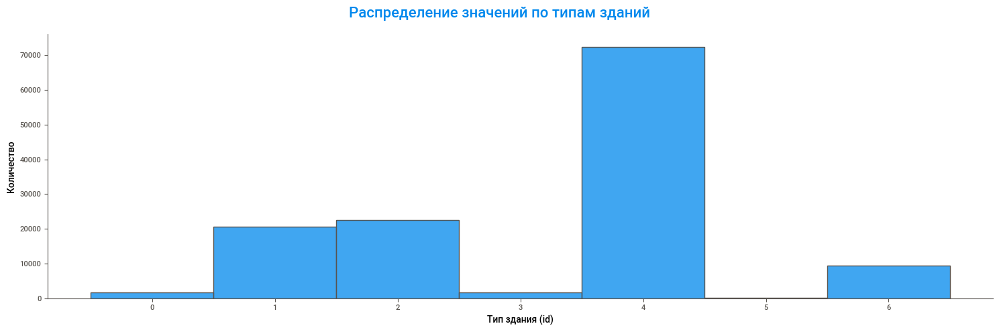

In [36]:
sns.displot(data, x="building_type_int", aspect=3, discrete=True)
add_plot_titles(suptitle="Распределение значений по типам зданий",
                xlabel="Тип здания (id)", ylabel="Количество")

Основная масса зданий приходится на 4-й тип, также достаточно большое количество зданий приходится на 2-й и 1-й типы зданий. Также заметное количество зданий с типом 6. Наименьшее количестов зданий приходится на 3 и 0, а меньше всего 5.

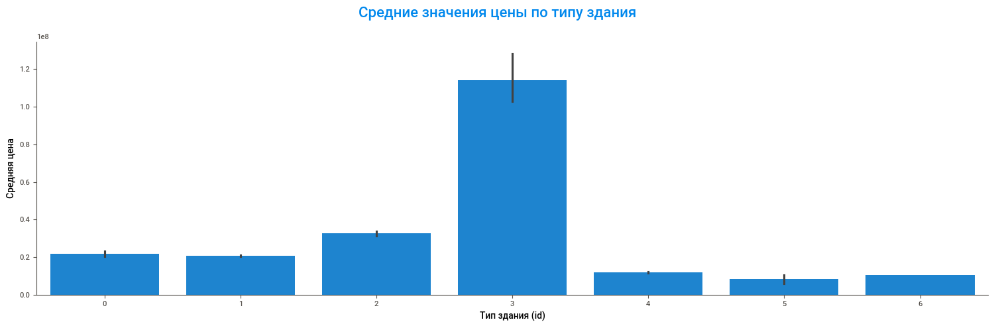

In [37]:
sns.catplot(data, x="building_type_int", y="price", kind="bar", aspect=3)
add_plot_titles(suptitle="Средние значения цены по типу здания",
                xlabel="Тип здания (id)", ylabel="Средняя цена")

Наибольшая средняя цена приходится на 3 тип зданий, остальные существенно дешевле. Данный признак явно является категориальным, причем признак возможно не имеет линейное отношение к целевому. Для более точной оценки необходимо сравнить с ценой квадратного метра.

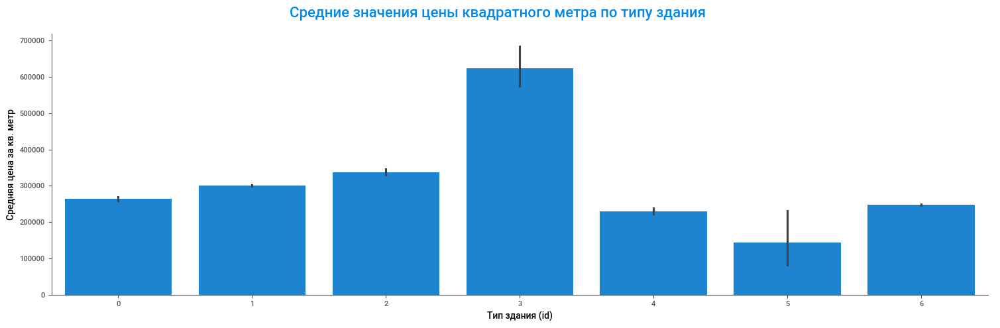

In [38]:
data["price_area"] = data["price"] / data["total_area"]
sns.catplot(data, x="building_type_int", y="price_area", kind="bar", aspect=3)
add_plot_titles(suptitle="Средние значения цены квадратного метра по типу здания",
                xlabel="Тип здания (id)", ylabel="Средняя цена за кв. метр")

Значения средней цены за квадратный метр существенно ближе. Однако также наблюдается отсутствие линейной зависимости с целевым признаком. Данный признак явно является категориальным и не имеет порядковой составляющей, по крайне мере по отношению к целевому признак, соответственно лучше его преобразовать в текст, чтобы в дальнейшем его было легче определить как категориальный.

In [39]:
data["building_type_int"] = data["building_type_int"].astype("str")
data.rename(columns={"building_type_int": "building_type"}, inplace=True)
data["building_type"].unique()

array(['6', '2', '4', '1', '3', '0', '5'], dtype=object)

#### Картография

Данные по широте и долготе распределены в пределах одного градуса и в целом не выглядят аномально. Оценим расположение случайных 5000 точек на карте.

In [40]:
mymap = folium.Map(location=[data["latitude"].mean(), data["longitude"].mean()],
                   zoom_start=8, attributionControl=0)
marker_cluster = MarkerCluster().add_to(mymap)

pb = tqdm(total=5000, desc="Загрузка точек на карту")
for idx, row in data.sample(5000, random_state=RANDOM_STATE).iterrows():
    pb.set_description(f"Загрузка точки {idx}")
    folium.Marker(
        location=[row["latitude"], row["longitude"]],
        popup=f"Цена: {row['price']}, \nкомнат: {row['rooms']}, \nэтаж: {row['floor']}"
    ).add_to(marker_cluster)
    pb.update(1)
pb.set_description("Загрузка точек завершена, запуск карты")
pb.close()
mymap

Загрузка точек на карту:   0%|          | 0/5000 [00:00<?, ?it/s]

Судя по карте датасет состоит из квартир города Москва. Преобразование данных не требуется.

In [41]:
del mymap, pb, idx

#### Высота потолков

Высота потолков начинается с 2 метров и доходит до 27, второе максимальное значение - 8 метров. В целом в сервисе Яндекс Недвижимость можно встретить двухуровневые и более квартиры со вторым светом, высота которых может доходить до 8 метров или даже выше, однако значение в 27 метров возможно является ошибкой. Для ETL-пайплайна лучше ограничим значением в 10 метров для высоты потолков.

In [42]:
data = data.query("ceiling_height <= 10")
print("Новый размер датасета:", data.shape)

Новый размер датасета: (128173, 20)


#### Другие признаки дома

По остальным признакам, относящимся к характеристикам дома аномалии не наблюдаются. Признаки останутся без преобразования.

#### Целевой признак

По целевому признаку в исходном датасете были большие выбросы. Возможно от части выбросов удалось избавиться в предыдущих этапах. Оценим распределение целевого признака после произведенных преобразований.

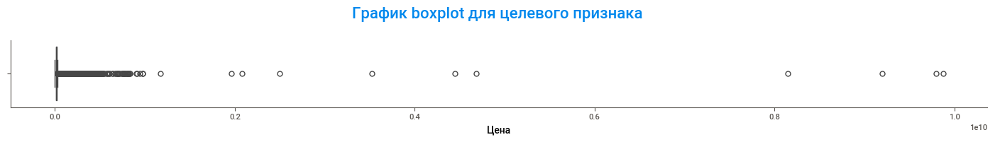

In [43]:
sns.catplot(data, x="price", kind="box", height=2, aspect=7)
add_plot_titles(suptitle="График boxplot для целевого признака", xlabel="Цена")

Очень большой разброс по цене, основные значения существенно ниже чем максимальные. Взглянем на данные с ограничением по максимальному значению.

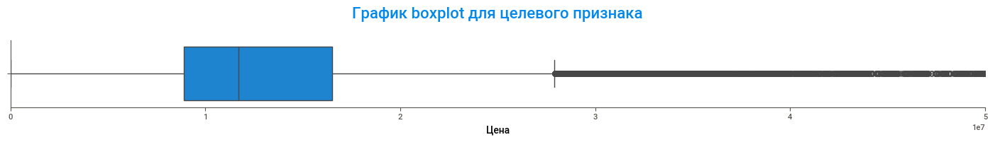

In [44]:
sns.catplot(data, x="price", kind="box", height=2, aspect=7)
plt.xlim((0, .5 * 1e8))
add_plot_titles(suptitle="График boxplot для целевого признака", xlabel="Цена")

Разброс целевого признака очень большой, однако рассматривать целевой признак как есть не имеет смысла, нужно оценить разброс значений не по общей стоимости квартиры, а по стоимости квадратного метра.

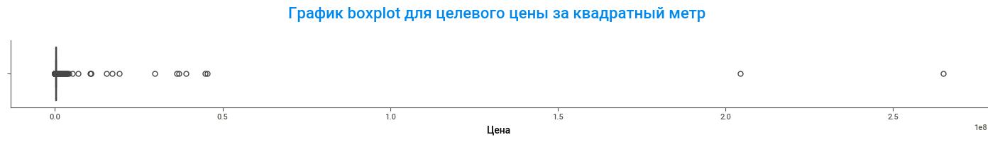

In [45]:
sns.catplot(data, x="price_area", kind="box", height=2, aspect=7)
add_plot_titles(suptitle="График boxplot для целевого цены за квадратный метр", xlabel="Цена")

По цене за квадратный метр наблюдается близкая картина, оценим основную массу значений.

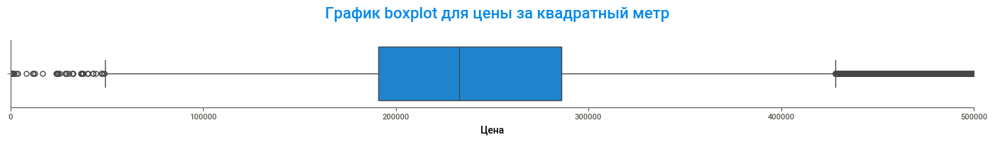

In [46]:
sns.catplot(data, x="price_area", kind="box", height=2, aspect=7)
plt.xlim((0, 500000))
add_plot_titles(suptitle="График boxplot для цены за квадратный метр", xlabel="Цена")

Взглянем также на взаимосвязь целевого признака с наиболее коррелирующим признаком общей площади, а также в разрезе наиболее коррелирующего категориального признака типа дома. Оценку проведем для большей части значений целевого признака в пределах

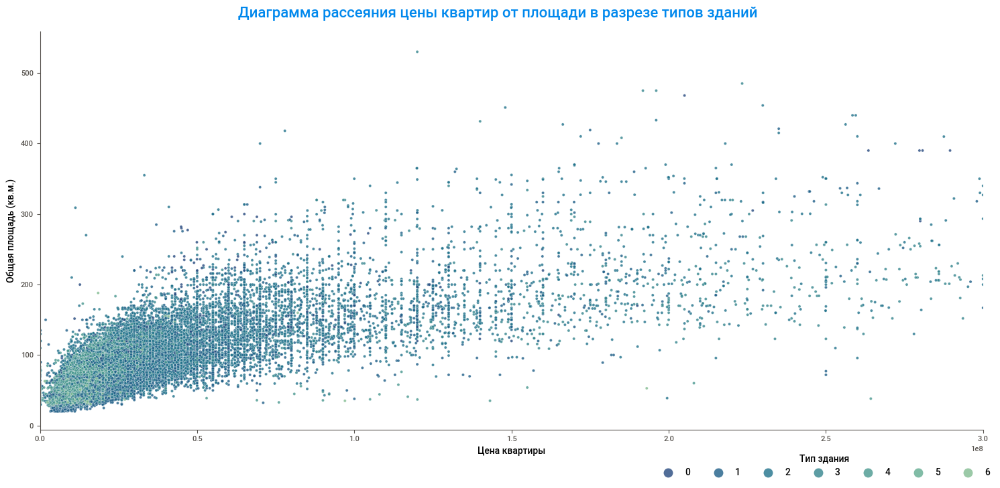

In [47]:
ax = sns.relplot(data, x="price", y="total_area", hue="building_type",
                 hue_order=data["building_type"].sort_values().unique(), 
                 alpha=0.8, height=7, aspect=2, palette="crest_r")
sns.move_legend(ax, "right", bbox_to_anchor=(1, 0), ncol=7, title="Тип здания")
for handles in ax.legend.legend_handles:
    handles.set_markersize(10)
plt.xlim((0, 1e9 * 0.3))
add_plot_titles(suptitle="Диаграмма рассеяния цены квартир от площади в разрезе типов зданий",
                xlabel="Цена квартиры", ylabel="Общая площадь (кв.м.)")

Можно отметить, что некоторые цены являются довольно популярными (вертикальные полосы из точек), куда попадают квартиры с различной общей площадью. Оценим количество вероятных выбросов по целевому признаку. Также для этих целей будем использовать аггрегацию по признакам - количество комнат, у которого высокая корреляция с общей площадью и его можно использовать как категориальный, а также признак типа здания.

In [48]:
print(
    "Количество вероятных выбросов по целевому признаку:",
is_outlier(data, target="price_area", by=["rooms", "building_type"], 
           min_val=0, verbose=True).sum()
)
data[is_outlier(data, target="price_area", by=["rooms", "building_type"], 
           verbose=False)].sort_values(by="price_area")

Выбросы с группировкой по ['rooms', 'building_type']
Минимальное значение выброса по всем группам: 0.0
Максимальное значение выброса по всем группам: 2915028.3980509317
Количество вероятных выбросов по целевому признаку: 3763


,id,rooms,total_area,kitchen_area,living_area,floor,is_apartment,building_type,build_year,latitude,longitude,ceiling_height,flats_count,floors_total,has_elevator,price,first_floor,second_floor,last_floor,price_area
66841,69633,2,42.0,6.000000,25.12,9,False,4,2007,55.724037,37.907486,2.78,368,24,True,11,False,False,False,2.619048e-01
101373,107198,2,70.0,10.110000,43.56,2,False,1,1972,55.796005,37.734650,2.64,288,9,True,19,False,True,False,2.714286e-01
58188,60417,1,36.0,7.910000,18.49,3,False,4,2012,55.677567,37.666252,2.80,180,10,True,1500,False,False,False,4.166667e+01
121103,128961,1,40.0,8.000000,26.00,6,False,2,2007,55.674576,37.760235,2.90,169,9,True,2000,False,False,False,5.000000e+01
21244,21821,2,60.0,8.660000,37.33,5,False,1,1966,55.726746,37.628326,2.70,70,9,True,3000,False,False,False,5.000000e+01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111341,118083,4,208.0,22.580000,127.35,6,False,3,2012,55.749588,37.597782,3.30,52,8,True,8147034112,False,False,False,3.916843e+07
81999,85787,5,220.0,22.299999,125.00,25,False,2,2006,55.652802,37.474201,3.10,219,33,True,9873737728,False,False,False,4.488063e+07
48755,50455,3,103.0,14.880000,59.88,5,False,2,2013,55.786572,37.617626,3.30,134,14,True,4686425088,False,False,False,4.549927e+07
39678,40855,2,45.0,6.000000,27.90,2,False,4,1974,55.578274,37.647091,2.65,214,9,True,9200000000,False,True,False,2.044444e+08


Таких выбросов не сильно большое количеством, считаю целесообразным очистить данные от выбросов по целевому признаку.

In [49]:
data = data[~is_outlier(data, target="price_area", by=["rooms", "building_type"], 
                        verbose=False)].copy()
print("Новый размер датасета:", data.drop(columns="price_area").shape)

Новый размер датасета: (124410, 19)


### Подготовка функций для DAG

Для нового DAG в именах функций будем использовать суффикс `clean` в данном ноутбуке.

#### Извлечение данных

Фуния извлечения данных аналогична первому DAG, только используется другой запрос и таблица базы данных.

In [50]:
# Фукнция выгрузки датасета
def extract_clean() -> pd.DataFrame:
    #hook = PostgresHook("destination_db")
    sql_query = f"SELECT * FROM {TBL_DST}" 
    #conn = hook.get_conn()
    data = pd.read_sql(sql_query, conn)
    #conn.close()
    return data

Извлечем данные и оценим:

In [51]:
data_clean = extract_clean()
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141362 entries, 0 to 141361
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 141362 non-null  int64  
 1   rooms              141362 non-null  int64  
 2   total_area         141362 non-null  float64
 3   kitchen_area       141362 non-null  float64
 4   living_area        141362 non-null  float64
 5   floor              141362 non-null  int64  
 6   studio             141362 non-null  bool   
 7   is_apartment       141362 non-null  bool   
 8   building_type_int  141362 non-null  int64  
 9   build_year         141362 non-null  int64  
 10  latitude           141362 non-null  float64
 11  longitude          141362 non-null  float64
 12  ceiling_height     141362 non-null  float64
 13  flats_count        141362 non-null  int64  
 14  floors_total       141362 non-null  int64  
 15  has_elevator       141362 non-null  bool   
 16  pr

#### Трансформация данных

Для трансформации будем использовать ранее подготовленную функцию поиска выбросов.

In [52]:
def transform_clean(df: pd.DataFrame) -> pd.DataFrame:
    # Удаление дубликатов
    result = df.drop_duplicates(
        subset=df.drop(columns=["id"]).columns.to_list()
    ).copy()
    # Удаление лишних признаков
    result.drop(columns="studio", inplace=True)

    # Список признаков с параметрами для поиска выбросов
    by_list = ["rooms", "building_type_int"]
    out_cols = [
        {# Количество комнат
            "name": "rooms", "by": None, "divider": None, "min_val": 1, 
            "max_val": None, "threshold": 1.5, "fill": np.nan
        },
        {# Общая площадь
            "name": "total_area", "by": by_list, "divider": None, 
            "min_val": 6, "max_val":None, "threshold": 1.5, "fill": np.nan
        },
        {# Площадь кухни
            "name": "kitchen_area", "by": by_list, "divider": "total_area", 
            "min_val": None, "max_val":None, "threshold": 1.5, "fill": 0
        },
        {# Жилая площадь 
            "name": "living_area", "by": by_list, "divider": "total_area", 
            "min_val": None, "max_val":None, "threshold": 1.5, "fill": 0
        },
        {# Цена квартиры
            "name": "price", "by": by_list, "divider": "total_area", 
            "min_val": 0, "max_val":None, "threshold": 1.5, "fill": np.nan
        },
    ]

    # Сброс значений для выбросов
    for col in out_cols:
        result.loc[is_outlier(
            result, target=col["name"], by=col["by"], divider=col["divider"], 
            min_val=col["min_val"], max_val=col["max_val"], 
            threshold=col["threshold"], verbose=False
        ), col["name"]] = col["fill"]
    
    # Удаление пропусков, в том числе выбросов
    result = result.dropna()

    # Заполнение нулевых значений медианой
    for col in ["kitchen_area", "living_area"]:
        zeros = result[col] == 0
        result.loc[zeros, col] = np.nan
        result.loc[zeros, col] = get_median_values(result, col, by_list, "total_area")[zeros]

    # Удаление некорректных значений
    result = result.query("(floor > 0) and (floor <= floors_total)").copy()
    result = result.query("(ceiling_height >= 2) and (ceiling_height <= 10)").copy()

    # Преобразование типа здания
    result["building_type_int"] = result["building_type_int"].astype("str")
    result.rename(columns={"building_type_int": "building_type"}, inplace=True)

    # Добавление новых признаков
    result["first_floor"] = result["floor"] == 1
    result["second_floor"] = result["floor"] == 2
    result["last_floor"] = result["floor"] == result["floors_total"]

    # Возврат результата
    return result

Оценим результаты работы функции в сравнении с предыдущим датасетом, обработанным вручную.

                                             |          | [  0%]   00:00 -> (? left)


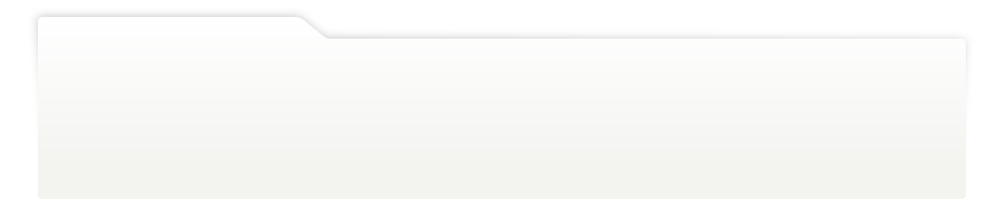
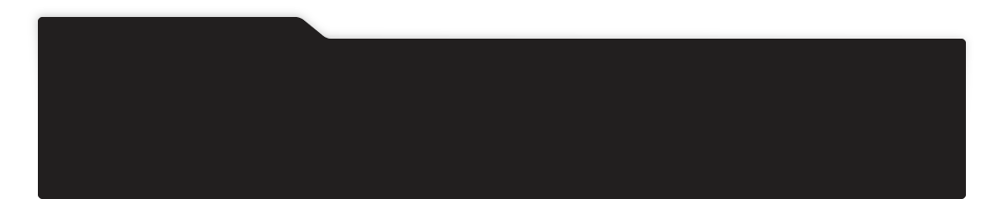
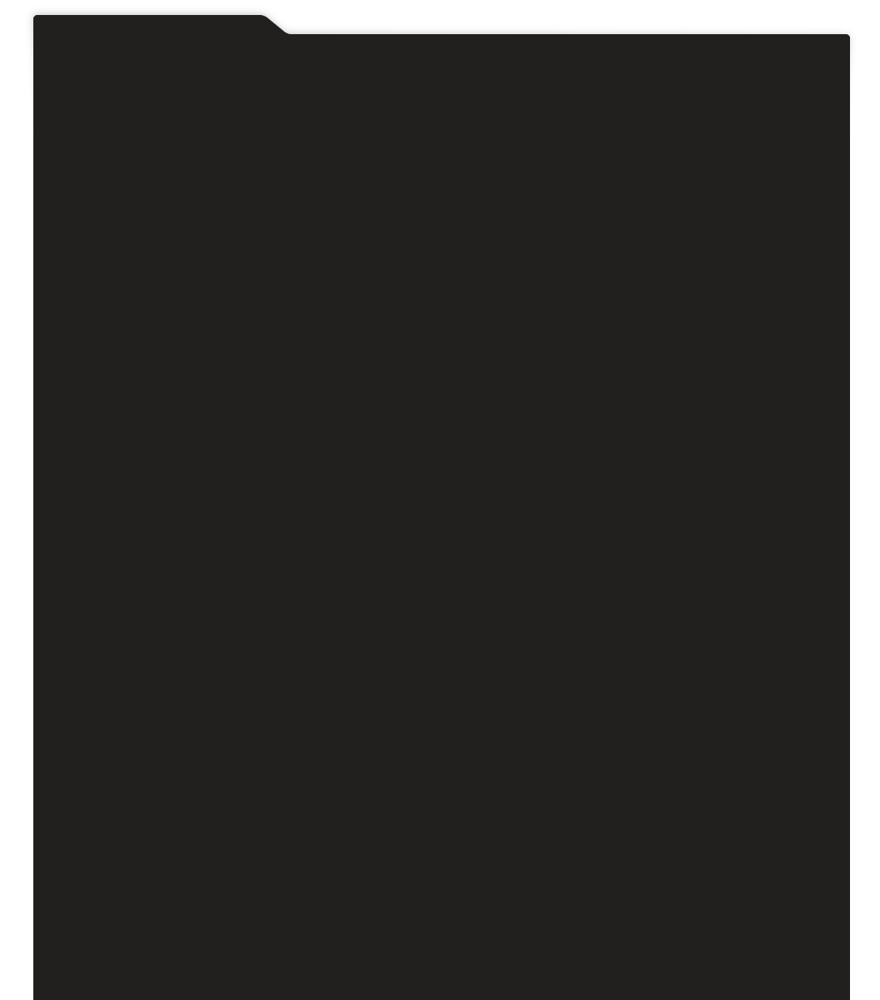
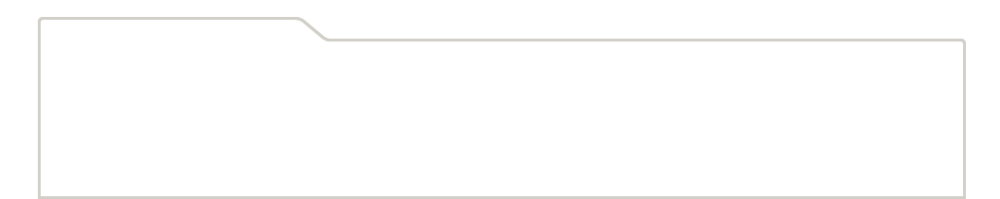
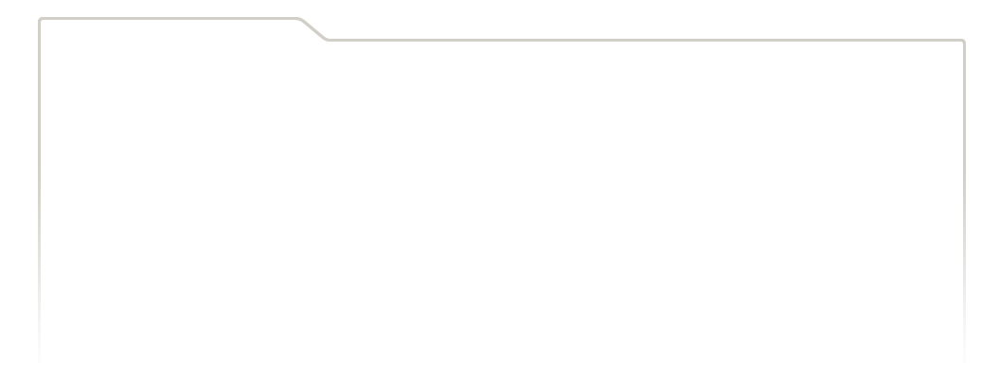
...
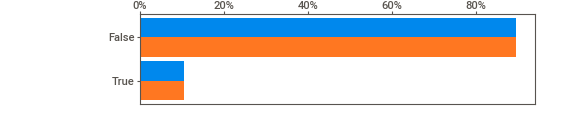
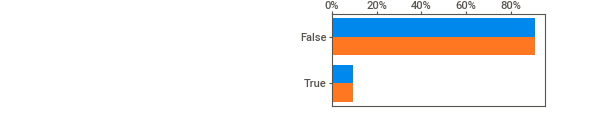
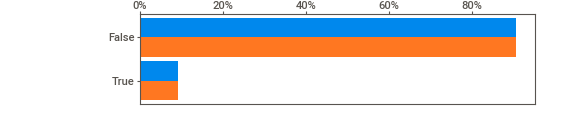
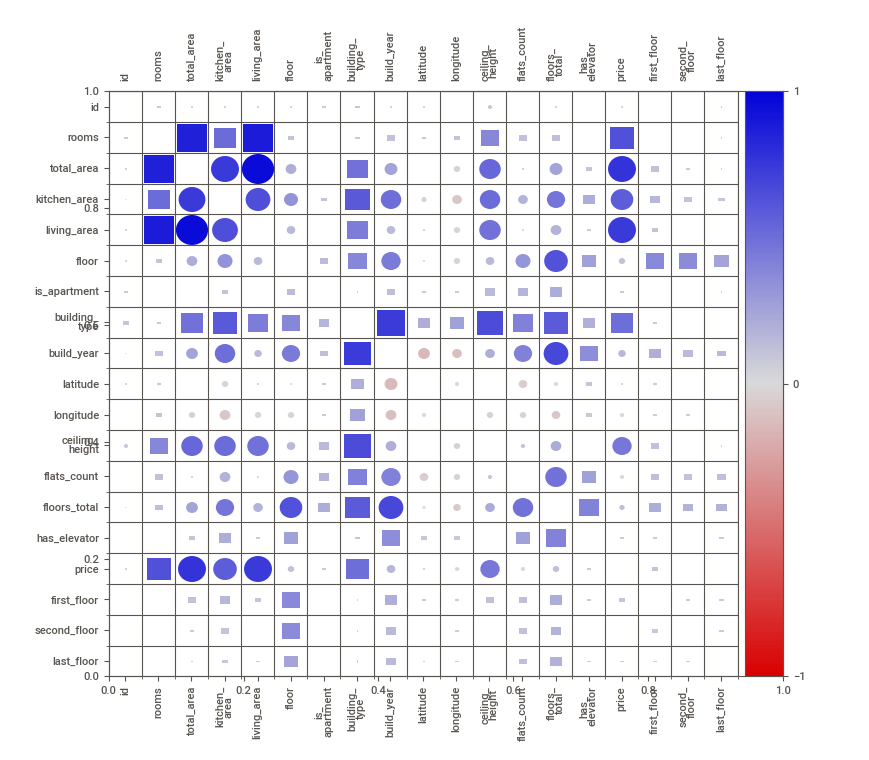
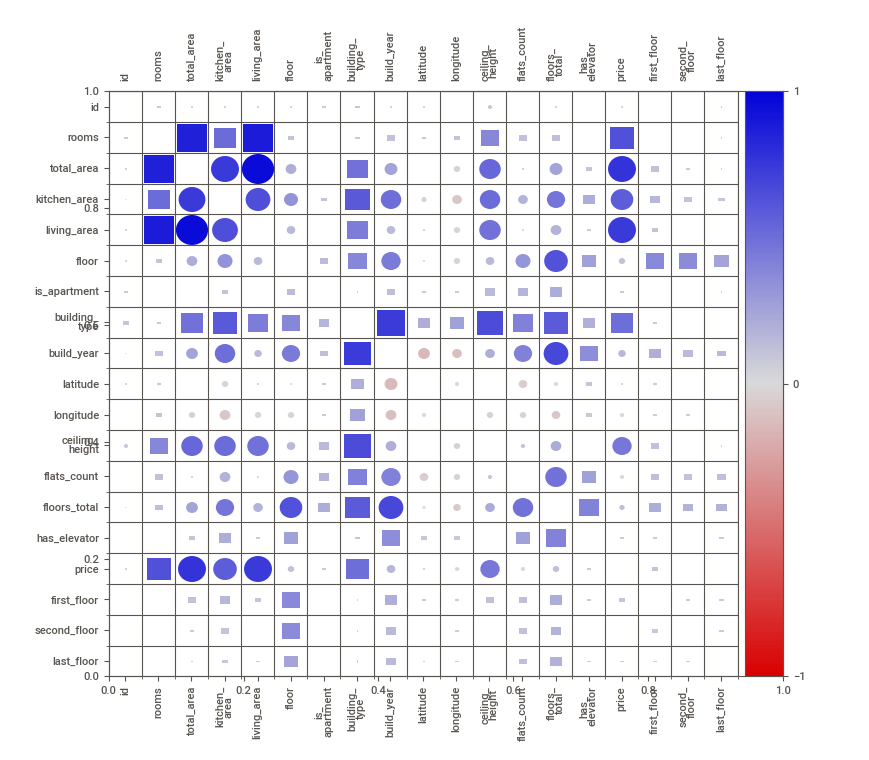

In [53]:
report_floor = sv.compare(
    (data.drop(columns="price_area"), "Ручное заполнение"), 
    (transform_clean(data_clean), "Заполнение функцией"))
report_floor.show_notebook()
del report_floor

На первый взгляд распределение в датасетах выглядит идентично, однако можно обнаружить небольшие расхождения по значениям площади кухни и жилой, которые были заполнены медианой. Это связано с тем, что расчет медианы вручную производился до исключения выбросов по оставшимся признакам, а в функции производится после, соответственно медиана немного сдвигается.

Функция трансформации готова, необходимо подготовить функции создания таблицы и загрузки очищенного датасета.

#### Создание таблицы и загрузка данных

In [54]:
data_clean = transform_clean(data_clean)
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 124410 entries, 0 to 141361
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              124410 non-null  int64  
 1   rooms           124410 non-null  float64
 2   total_area      124410 non-null  float64
 3   kitchen_area    124410 non-null  float64
 4   living_area     124410 non-null  float64
 5   floor           124410 non-null  int64  
 6   is_apartment    124410 non-null  bool   
 7   building_type   124410 non-null  object 
 8   build_year      124410 non-null  int64  
 9   latitude        124410 non-null  float64
 10  longitude       124410 non-null  float64
 11  ceiling_height  124410 non-null  float64
 12  flats_count     124410 non-null  int64  
 13  floors_total    124410 non-null  int64  
 14  has_elevator    124410 non-null  bool   
 15  price           124410 non-null  float64
 16  first_floor     124410 non-null  bool   
 17  second_floor   

Подготовим функцию для создания таблицы в базе данных.

In [55]:
# Функция создания таблицы при ее отсутствии
def create_table_clean():
    #hook = PostgresHook("destination_db")
    #conn = hook.get_sqlalchemy_engine()
    from sqlalchemy import MetaData
    metadata = MetaData()
    from sqlalchemy import Table, Column, Integer, BigInteger, Float, Boolean, String, UniqueConstraint, inspect
    flats_fstore = Table(
        TBL_DST_CLEAN, metadata,
        Column("id", Integer, primary_key=True, autoincrement=True),  
        Column("rooms", Float),
        Column("total_area", Float),
        Column("kitchen_area", Float),
        Column("living_area", Float),
        Column("floor", Integer),  
        Column("is_apartment", Boolean),
        Column("building_type", String),  
        Column("build_year", Integer),  
        Column("latitude", Float),
        Column("longitude", Float),
        Column("ceiling_height", Float),
        Column("flats_count", Integer),  
        Column("floors_total", Integer),  
        Column("has_elevator", Boolean),
        Column("price", BigInteger),
        Column("first_floor", Boolean),
        Column("second_floor", Boolean),
        Column("last_floor", Boolean),
        UniqueConstraint('id', name='unique_flats_clean_id_constraint')
    )
    if not inspect(conn).has_table(flats_fstore.name): 
        metadata.create_all(conn)
    #conn.close()

Проверим работу функции создания таблицы.

In [56]:
create_table_clean()
if inspect(conn).has_table(TBL_DST):
    print(f"Таблица {TBL_DST} создана")
else:
    print("Что-то пошло не так =(")

Таблица flats_fstore создана


Подготовим функцию загрузки данных, которая будет полностью аналогична предыдущей кроме таблицы назначения.

In [57]:
# Функция загрузки
def load_clean(data: pd.DataFrame):
    try: # Эта часть для DAG
        #hook = PostgresHook("destination_db")
        hook = None # Для проверки в ноутбуке без установки Airflow
        hook.insert_rows(
            table=TBL_DST_CLEAN,
            replace=True,
            target_fields=data.columns.tolist(),
            replace_index=['id'],
            rows=data.values.tolist()
        )
        hook.close()
    except Exception as e: # Эта часть только для загрузки из ноутбука без Airflow
        err_msg = str(e)
        data.to_sql(TBL_DST_CLEAN, con=conn, if_exists="replace", index=False)

Произведем загрузку данных.

In [58]:
load_clean(data_clean)

### Промежуточные итоги

В рамках 2 этапа проведен исследовательский анализ данных. По результатам анализа выявлено наличие дубликатов, которые были исключены. Также исключены записи, значения которых имеют большие отклонения или очень редкие значения по количеству комнат `rooms`, общей площади `total_area`, высоте потолков `ceiling_height` и по целевому признаку цены `price`. Обработка выбросов осуществлялась на базе статистического метода межквартильных интервалов (IQR), выбросами определены все значения за пределами 1.5-кратного межквартильного интервала от первого (Q1) и третьего (Q3). При этом для общей площади и цены за квадратный метр определение межквартильного интервала произведено в разрезе количества комнат и типа здания. Высота потолков была ограничена значением в 10 метров.

Также на базе данного метода определены вероятно некорректные значения жилой площади и кухни исходя из их отношения к общей площади. Все такие значения были исправлены на медиану. Признак `building_type_int` переведен в строковый и переименован в `building_type` для возможности в дальнейшем обрабатывать его как категориальный.

По результатам анализа подготовлены фукнции ETL-пайплайна для добавления в DAG Airflow. Данные после трансформации загружены в базу `flats_fstore_clean` посредством Airflow. Подготовка DAG произведена с использованием декораторов. Второй DAG располагается в файле `part1_airflow\dags\flats_fstore_clean.py`.

Использован тот же плагин для отправки сообщений о статусе исполнения DAG в Telegram.

## Итоги подготовки данных посредством Airflow

In [59]:
# Закрытие соединений
conn.dispose()

Подготовка данных посредством Airflow произведена в 2 этапа.

В рамках 1-го этапа произведено извлечение данных с объединением таблиц. Данные без трансформации загружены в базу `flats_fstore` посредством Airflow. 

В рамках 2 этапа проведен исследовательский анализ данных, их трансформация и загрузка в базу `flats_fstore_clean`. По результатам анализа произведено следующее:

1. Исключены дубликаты данных;
2. Исключены выбросы и редкие значения по следующим признакам:
    - количество комнат `rooms` за пределами межквартильного размаха в 1.5 IQR от Q1 и Q3; 
    - общая площадь `total_area` аналогичным статистическим методом в разрезе количества комнат и типа здания;
    - целевой признак цены `price` квартиры также статистическим методом исходя из цены за квадратный метр в разрезе количества комнат и типа здания;
    - высота потолков `ceiling_height` путем исключения значений более 10 метров;
    - также добавлено ограничение по признаку `floor` - не выше значения `floors_total` на случай появления ошибок в данных.\
    - в случае наличия пропусков в данных они будут исключены из датасета.
3. Проведена обработка вероятно некорректных значений признаков площади кухни `kitchen_area` и жилой площади `living_area`, которая производилась также методом межквартильного размаха, признанные выбросом значения установлены медианой по соотношению к общей площади в разрезе количества комнат и типа здания.
4. Признак `building_type_int` переименован в `building_type` и преобразован в категориальный.

Подготовка DAG производилась с использованием декораторов airflow. Первый DAG, который обеспечивает перенос объединенных данных в хранилище признаков, располагается в файле `part1_airflow\dags\flats_fstore.py`. Второй DAG располагается в файле `part1_airflow\dags\flats_fstore_clean.py` и обеспечивает трансформацию данных и загрузку очищенных признаков в хранилище.

В целях получения оповещений о ходе выполнения DAG, использован плагин для отправки сообщений в Telegram. Сообщение отправляет Telegram бот в группу [TestAirflow](https://t.me/+vmtO5jVkLgtjZjEy "Invite link to Telegram group"). Код плагина располагается в файле `part1_airflow\plugins\messages.py`.